# MLP-based Rigid-Registration

In [41]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"

# Residual MLP-based set abstraction module (similar to PointNet++ but more lightweight)
class ResidualPointNetSetAbstraction(nn.Module):
    def __init__(self, input_dim, mlp_dims):
        super().__init__()
        layers = []
        last_dim = input_dim
        for dim in mlp_dims:
            layers.append(nn.Linear(last_dim, dim))
            layers.append(nn.LayerNorm(dim))
            layers.append(nn.ReLU())
            last_dim = dim
        self.mlp = nn.Sequential(*layers)
        
        # If input and output dimensions differ
        self.shortcut = nn.Linear(input_dim, last_dim) if input_dim != last_dim else nn.Identity()

    def forward(self, x):
        # x: (B, N, C_in)
        B, N, C_in = x.shape
        x_flat = x.view(B*N, C_in)  # (B*N, C_in)
        shortcut = self.shortcut(x_flat)  # (B*N, C_out)

        out = self.mlp(x_flat)   # (B*N, C_out)
        out = out + shortcut     # Residual connection
        out = out.view(B, N, -1) # (B, N, C_out)
        return out

# Residual model for landmarks-based rigid registration 
class LandmarkRigidPointNetPP(nn.Module):
    def __init__(self, num_landmarks):
        super().__init__()
        self.num_landmarks = num_landmarks
        input_dim = 6  # src(3) + tgt(3)

        # Low-level feature extraction
        self.sa1 = ResidualPointNetSetAbstraction(input_dim=input_dim, mlp_dims=[128, 128, 256])
        # Deeper representation
        self.sa2 = ResidualPointNetSetAbstraction(input_dim=256, mlp_dims=[256, 512])

        # Fully connected layers to regress a 3D rotation vector
        self.fc = nn.Sequential(
            nn.Linear(1024, 256),
            nn.LayerNorm(256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.LayerNorm(128),
            nn.ReLU(),
            nn.Linear(128, 3)  # Output axis-angle rotation vector
        )

    def forward(self, src_lm, tgt_lm):
        x = torch.cat([src_lm, tgt_lm], dim=-1)  # (N, 6)
        x = x.unsqueeze(0)  # (B=1, N, 6)

        x = self.sa1(x)  # (1, N, 256)
        x = self.sa2(x)  # (1, N, 512)

        # Global pooling
        x_max = torch.max(x, dim=1)[0]  # (1, 512)
        x_avg = torch.mean(x, dim=1)    # (1, 512)
        x = torch.cat([x_max, x_avg], dim=-1)  # (1, 1024)

        rvec = self.fc(x.squeeze(0))  # (3,)
        R = rodrigues_single(rvec)    # Convert to rotation matrix
        return R

# Convert a 3D axis-angle vector to a 3×3 rotation matrix using Rodrigues' formula.
def rodrigues_single(rvec):
    theta = torch.norm(rvec).clamp(min=1e-8)
    k = rvec / theta

    # Skew-symmetric matrix
    K = torch.zeros(3,3, device=rvec.device)
    K[0,1] = -k[2]
    K[0,2] = k[1]
    K[1,0] = k[2]
    K[1,2] = -k[0]
    K[2,0] = -k[1]
    K[2,1] = k[0]

    I = torch.eye(3, device=rvec.device)
    R = I + torch.sin(theta) * K + (1 - torch.cos(theta)) * (K @ K)

    return R

In [34]:
# Computes the mse for training
def landmark_alignment_loss(R, src_lm, tgt_lm):
    src_trans = src_lm @ R.T # (L, 3)
    loss = torch.mean(torch.sum((src_trans - tgt_lm) ** 2, dim=1))  # MSE loss
    return loss
    
# Computes the Chamfer Distance for training
def chamfer_distance_torch(P, Q):
   
    P_expand = P.unsqueeze(1)  # (N,1,3)
    Q_expand = Q.unsqueeze(0)  # (1,M,3)

    dists = torch.sum((P_expand - Q_expand) ** 2, dim=-1)  # (N,M)

    dist_P2Q = torch.min(dists, dim=1)[0]  # (N,)
    dist_Q2P = torch.min(dists, dim=0)[0]  # (M,)

    loss = dist_P2Q.mean() + dist_Q2P.mean()
    return loss
    
# MSE loss for evaluationi
def compute_nn_mse(source_points, target_points):
    tree = cKDTree(target_points)
    dists, _ = tree.query(source_points)
    return np.mean(dists ** 2)
    
# Chamfer_distance loss for evaluation
def chamfer_distance(P, Q):
    tree_Q = cKDTree(Q)
    dists_P, _ = tree_Q.query(P, k=1)  
    tree_P = cKDTree(P)
    dists_Q, _ = tree_P.query(Q, k=1)

    return np.sum(dists_P ** 2) + np.sum(dists_Q ** 2)


(42, 3)
(42, 3)


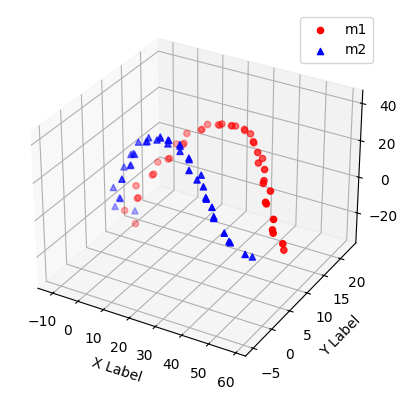

torch.Size([42, 3])
torch.Size([42, 3])


In [42]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Function to load landmarks from .json
def load_landmarks_from_json(json_path):
    with open(json_path, 'r', encoding='utf-8') as f:
        data = json.load(f)  # read JSON data
    # Extract "location" from each item
    landmarks = np.array([item["location"] for item in data if "location" in item])
    return landmarks  # return (M,3) NumPy array

# Load ROI landmarks from .json files
landmarks1 = load_landmarks_from_json("landmarks/A01/08_lower16.json")  # Shape (M,3)
landmarks2 = load_landmarks_from_json("landmark/A01/08_lower13.json")  # Shape (M,3)
print(landmarks1.shape)
print(landmarks2.shape)

# 3D Visualization
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the two landmark sets
ax.scatter(landmarks1[:, 0], landmarks1[:, 1], landmarks1[:, 2], c='r', marker='o', label='m1')
ax.scatter(landmarks2[:, 0], landmarks2[:, 1], landmarks2[:, 2], c='b', marker='^', label='m2')


ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

ax.legend()

plt.show()
landmarks1 = torch.tensor(landmarks1).float().cuda()  # (M, 3)
landmarks2 = torch.tensor(landmarks2).float().cuda()
print(landmarks1.shape)
print(landmarks2.shape)
num_landmarks = landmarks1.shape[0]

In [43]:
# Performs centroid-based normalization 
def normalize_landmarks(landmarks):
    mean = landmarks.mean(dim=0, keepdim=True)     
    return landmarks - mean, mean    

landmarks1, mean1 = normalize_landmarks(landmarks1)
landmarks2, mean2 = normalize_landmarks(landmarks2)

mean1 = mean1.cpu().numpy().T
mean2 = mean2.cpu().numpy().T
print(mean1.shape)
print(mean2.shape)

(3, 1)
(3, 1)


In [44]:
# Use simplified ICP for refinement
import open3d as o3d  

def icp_refine(source_points, target_points, init_R, init_t, threshold=0.5, max_iterations=10):
    source_points_init = source_points @ init_R.T + init_t.reshape(1, 3)

    source = o3d.geometry.PointCloud()
    source.points = o3d.utility.Vector3dVector(source_points_init)

    target = o3d.geometry.PointCloud()
    target.points = o3d.utility.Vector3dVector(target_points)

    reg_p2p = o3d.pipelines.registration.registration_icp(
        source,
        target,
        threshold,
        np.eye(4),
        o3d.pipelines.registration.TransformationEstimationPointToPoint(),
        o3d.pipelines.registration.ICPConvergenceCriteria(max_iteration=max_iterations)
    )

    transformation = reg_p2p.transformation
    R_icp = transformation[:3, :3]
    t_icp = transformation[:3, 3]

    return R_icp, t_icp

In [46]:
# Training model
model = LandmarkRigidPointNetPP(num_landmarks=num_landmarks).cuda()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, amsgrad=True)

best_loss = float('inf')
best_R = None

for step in range(500): 
    R_pred  = model(landmarks1, landmarks2)

    
    landmarks1_transformed = landmarks1 @ R_pred.T  

    loss = chamfer_distance_torch(landmarks1_transformed, landmarks2)  
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    if loss.item() < best_loss:
        best_loss = loss.item()
        best_R = R_pred.detach().cpu().clone()

    print(f"[Step {step}] Loss: {loss.item():.6f}")

R_final = best_R.numpy()
t_final = mean2 - R_final @ mean1
t_final = (mean2 - R_final @ mean1).flatten()


R_icp, t_icp = icp_refine(
    landmarks1.cpu().numpy(), 
    landmarks2.cpu().numpy(), 
    R_final, 
    t_final,
    threshold=0.5,        
    max_iterations=10     
)

R_final = R_icp @ R_final
t_final = (R_icp @ t_final.reshape(3, 1)).flatten() + t_icp

print("\n=== Final Prediction ===")
print("Rotation matrix R:")
print(np.array2string(R_final, precision=4, suppress_small=True))
print("Translation vector t:", np.round(t_final, 4))

[Step 0] Loss: 167.392242
[Step 1] Loss: 9.504660
[Step 2] Loss: 56.735054
[Step 3] Loss: 50.074631
[Step 4] Loss: 32.533997
[Step 5] Loss: 12.098818
[Step 6] Loss: 3.465192
[Step 7] Loss: 16.114670
[Step 8] Loss: 22.257019
[Step 9] Loss: 20.629436
[Step 10] Loss: 15.105395
[Step 11] Loss: 8.281702
[Step 12] Loss: 1.684635
[Step 13] Loss: 4.367323
[Step 14] Loss: 8.934168
[Step 15] Loss: 9.779341
[Step 16] Loss: 7.675697
[Step 17] Loss: 3.401768
[Step 18] Loss: 2.462445
[Step 19] Loss: 4.096626
[Step 20] Loss: 4.726841
[Step 21] Loss: 3.269792
[Step 22] Loss: 1.831642
[Step 23] Loss: 2.055804
[Step 24] Loss: 3.257645
[Step 25] Loss: 3.543246
[Step 26] Loss: 2.321343
[Step 27] Loss: 0.930507
[Step 28] Loss: 0.670430
[Step 29] Loss: 1.578742
[Step 30] Loss: 2.389999
[Step 31] Loss: 2.197040
[Step 32] Loss: 1.335431
[Step 33] Loss: 0.728205
[Step 34] Loss: 0.837620
[Step 35] Loss: 1.224180
[Step 36] Loss: 1.366261
[Step 37] Loss: 1.155527
[Step 38] Loss: 0.880406
[Step 39] Loss: 0.858520


In [47]:
# Apply transformation in the original image and evluation 
import trimesh
from scipy.spatial import cKDTree


def load_mesh(file_path):
    mesh = trimesh.load(file_path)  # Load the triangular mesh
    points = np.array(mesh.vertices)  # Extract vertex coordinates (N, 3)
    return points

teeth1 = load_mesh("pointcloud_raw/A1 lower 2016.stl")
teeth2 = load_mesh("pointcloud_raw/A1 lower 2013.ply")

teeth1_transformed = (teeth1 @ R_final.T) + t_final

mse_original = compute_nn_mse(teeth1, teeth2)
mse_transformed = compute_nn_mse(teeth1_transformed, teeth2)

print(f"Original MSE (before transformation): {mse_original:.6f}")
print(f"Transformed MSE (after alignment): {mse_transformed:.6f}")

chamfer_original = chamfer_distance(teeth1, teeth2)
chamfer_transformed = chamfer_distance(teeth1_transformed, teeth2)

print(f"Original Chamfer distance (before transformation) loss: {chamfer_original:.6f}")
print(f"Transformed Chamfer distance (after alignment) loss: {chamfer_transformed:.6f}")

mesh1 = trimesh.load("pointcloud_raw/A1 lower 2016.stl")
mesh2 = trimesh.load("pointcloud_raw/A1 lower 2013.ply")
mesh1_aligned = trimesh.Trimesh(vertices=teeth1_transformed, faces=mesh1.faces)

mesh1_aligned.export("pointcloud_raw/A1_2016_aligned.ply", encoding='ascii')

Original MSE (before transformation): 326.479000
Transformed MSE (after alignment): 1.130998
Original Chamfer distance (before transformation) loss: 122676122.144128
Transformed Chamfer distance (after alignment) loss: 271795.605840


b'ply\nformat ascii 1.0\ncomment https://github.com/mikedh/trimesh\nelement vertex 221340\nproperty float x\nproperty float y\nproperty float z\nelement face 439163\nproperty list uchar int vertex_indices\nend_header\n-2.27041054 3.85180044 -13.21564960\n-2.40905547 3.81565714 -13.16054440\n-2.29159665 3.75805020 -13.13863754\n-2.17008305 3.72162294 -13.12632942\n-2.12544847 3.82281232 -13.22139454\n-2.02128172 3.80119705 -13.22678471\n-2.05429029 3.66528058 -13.09703255\n-1.92917407 3.64828539 -13.09448147\n-1.89675987 3.77841949 -13.23084259\n-0.96423799 3.80595517 -13.54378033\n-1.11068821 3.78149033 -13.47081470\n-0.98677391 3.71294188 -13.46354485\n-0.84965050 3.78037906 -13.55947971\n-0.87077457 3.64018035 -13.43994331\n-1.36450803 3.79192567 -13.36822987\n-1.50811136 3.76331425 -13.30289364\n-1.39282358 3.69056916 -13.26764297\n-1.75625312 3.81957865 -13.27608395\n-1.77940440 3.72699213 -13.18990517\n-1.65882599 3.68689370 -13.18137455\n-1.63949811 3.79760599 -13.28251362\n-1.82

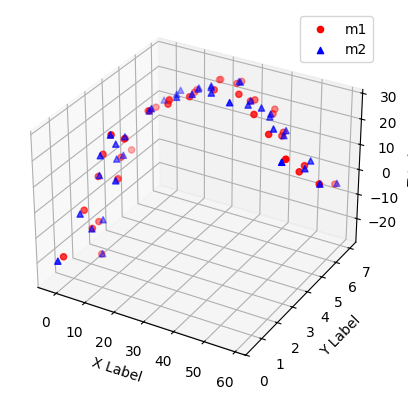

In [22]:
# Load ROI landmarks from .json files
landmarks1 = load_landmarks_from_json(r"C:\Users\Fu\Desktop\landmarks\A32\lower16.json")  # Shape (M,3)
landmarks2 = load_landmarks_from_json(r"C:\Users\Fu\Desktop\landmarks\A32\lower12.json")  # Shape (M,3)

# Load teeth mesh data from .csv files
#landmarks1 = pd.read_csv(r"C:\Users\Fu\download\2013.csv")
#landmarks2 = pd.read_csv(r"C:\Users\Fu\Desktop\2016.csv")
# Ensure both landmarks are represented as M×3 matrices
assert landmarks1.shape == landmarks2.shape, "The number of landmarks should be matched"

landmarks1_transformed = (landmarks1 @ R_final.T)+ t_final

#  3D Visualization on landmarks 
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')


ax.scatter(landmarks1_transformed[:, 0], landmarks1_transformed[:, 1], landmarks1_transformed[:, 2], c='r', marker='o', label='m1')
ax.scatter(landmarks2[:, 0], landmarks2[:, 1], landmarks2[:, 2], c='b', marker='^', label='m2')


ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')


ax.legend()

plt.show()
